# SI221 - TP PCA & K-means

### Données

Nous allons travailler sur des images satellitaire: celles-ci sont capturées via différent capteurs, chacun correspondant à un domaine de longueur d'ondes. Nous avons donc, pour chaque image, un certain nombre de *canaux* - chacun correspondant à un *domaine spectral*. 

- Données SPOT sur Tarascon: La taille du pixel est de 20m. Il y a 3 canaux: 
    - 0.50-0.59 $\mu$
    - 0.61-0.68 $\mu$
    - 0.78-0.89 $\mu$
    
- Données LANDSAT sur Tarascon: La taille du pixel est de 30m. Il y a 8 canaux:
    - 0.45-0.52 $\mu$       
    - 0.52-0.60 $\mu$     
    - 0.63-0.69 $\mu$
    - 0.75-0.90 $\mu$ (Proche InfraRouge : PIR)     
    - 2.08-2.35 $\mu$ (Moyen InfraRouge : MIR)    
    - 10.40-12.50 $\mu$ (infra rouge thermique)      
    - 1.55-1.75 $\mu$ (Moyen InfraRouge : MIR)     
    - 0.52-0.90 $\mu$ (panchromatique)   
    
- Données LANDSAT sur Kedougou: La taille du pixel est de 30m; mais, à la différence des données acquises sur Tarascon, il y a un problème d’acquisition de données inhérent au capteur. Il y a ici 6 canaux:
    - 0.45-0.52 $\mu$
    - 0.52-0.60 $\mu$
    - 0.63-0.69 $\mu$
    - 0.76-0.90 $\mu$
    - 2.08-2.35 $\mu$
    - 1.55-1.75 $\mu$

### PCA

Le recours à l’ACP va permettre de réduire la dimension de l’espace de représentation et ici de réduire le nombre de canaux nécessaires pour conserver l’essentiel de l’information. De manière générale, le but de l’ACP est de visualiser dans un espace de plus petite dimension les proximités entre les observations (ici les pixels) et ainsi les corrélation entre les variables (les valeurs des pixels sur les différents canaux).  

**Rappel sur l'ACP**: Avec $N$ individus, pour lesquels on dispose de $p$ caractéristiques (ce qui veut dire que son vecteur est de dimension $p$), on notera $\mathbf{x}^i_k$ la $k$ième caractéristique de l'individu $i$. On note donc $\mathbf{X}$ la matrice dans laquelle chaque ligne est constituée par un individu et chaque colonne représente une variable. 

L'ACP est constituée par les étapes suivantes :
- Centrage et réduction des données: Notant $m_k$ et $\sigma_k$, les moyennes et écarts-type de la $k$ième variable, on notera $\mathbf{x}'^i_k=\frac{\mathbf{x}^i_k-m_k}{\sigma_k}$ la donnée centrée réduite.
- Calcul de la matrice de covariance des données centrées réduites.
- Calcul des valeurs propres $\lambda_j$ et vecteurs propres $\mathbf{u}_j$ de la matrice de covariance;
- Vérification de l'ordre des vecteurs propres selon les valeurs propres croissantes;
- Calcul des composantes principales $\mathbf{x}''^i_q$ exprimées dans la base des vecteurs propres: $$ \mathbf{x}''^i_q={\mathbf{x}'^i}^T \mathbf{u}_q $$


On obtient donc de nouvelles variables constituées par des combinaisons linéaires des anciennes. Les composantes principales contiennent une quantité d'information proportionnelle à la valeur propre correspondante. On définit ainsi le pourcentage d'inertie par $\frac{\lambda_i}{\sum_{j=1}^{p}\lambda_j}$. 

Le but premier de ce TP est **l'application du PCA (ou ACP, Analyse en composantes principales) à ces images satellitaires, ou les individus sont chaque canal de l'image, et les variables chacun des pixels**. 

In [235]:
import matplotlib.pyplot as plt
import numpy as np

Les données proviennent de fichier .mat, avec un fichier par canal. On peut commencer par travailler avec SPOT, qui n'a que 3 canaux. Commençons par charger les images et les réunir sur une même matrice.

In [236]:
from scipy.io import loadmat

def load_image(path_img):
    im_loaded = loadmat('./'+ path_img +'.mat')
    return im_loaded['imm']

In [237]:
# First image: SPOT
path_img = 'SPOT/cam'
paths_img_st = ['SPOT/cam1', 'Landstat_Tarascon/landsattarasconC1', 'Landstat_Kedougou/landsatkedougouC1']
n_bands = 3

# Let's take a look at the first channel's size
img = load_image(path_img +'1')
(imgsh1, imgsh2)=img.shape
print(img.shape)

(512, 512)


In [238]:
img = np.zeros((img.shape[0], img.shape[1], n_bands))
# Stacking up images into the numpy array:
for i in range(n_bands):
    img[:,:,i]=load_image(path_img+str(i+1))

Essayons d'abord de comprendre, en regardant les images, les caractéristiques des différents canaux et les informations qu'ils comportent. 

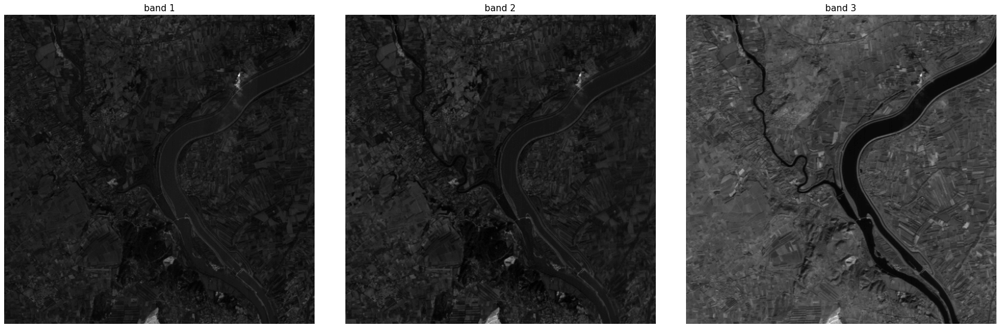

In [239]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as grid

fig,axes = plt.subplots(1,n_bands, figsize=(n_bands*10,12), sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
axes = axes.ravel()

for i in range(n_bands):
    # Use floats instead of 8-bit integers for a clearer view of the image
    axes[i].imshow(img[:,:,i] / 255, cmap='gray')
    axes[i].set_title('band '+str(i+1),fontsize=15)
    axes[i].axis('off')

Qu'observez-vous ? 

La troisième est dans des tons beaucoup plus clairs que les deux autres, mais semble moins voir les détails (notamment en bas à gauche), par contre la rivière est beaucoup plus visible que les deux autres (notamment en haut à gauche). 
</br>
Les deux autres semblent assez similaires, sont dans des nuances de gris beaucoup plus sombres et voient des détails plus précis que la troisième. Cependant on comprend moins bien que dans la troisième bande l'idée générale de l'image. 

Chaque image est un individu: on va d'abord redimensionner les images en vecteurs (pas besoin d'information de structure spatiale !) et on calcule la moyenne et l’écart-type de chacun de ces vecteurs pour les centrer.

In [240]:
# Reshape the image for practicality: 
imgresh = []
for i in range(n_bands):
    imgresh.append(np.reshape(img[:,:,i], -1).reshape((512*512,1)))

resh_imgs = [[0]*512*512]*n_bands
for i in range(n_bands):
    resh_imgs[i] = imgresh[i]

In [241]:
# Standardization:
means, stands, std_imgs = [],[],[]
for i in range(n_bands):
    means.append(np.mean(resh_imgs[i]))
    stands.append(np.std(resh_imgs[i]))
    std_imgs.append((resh_imgs[i]-means[i])/stands[i])

**Vecteurs propres et valeurs propres**: on concatène les vecteurs centrés en une seule matrice dont on calcule la matrice de covariance, qui mesure la relation entre les images. On calcule ensuite les valeurs propres et les vecteurs propres de la matrice de covariance grâce à la fonction ```eig```. On obtient les vecteurs propres, concaténés. 

In [242]:
# Compute the covariance matrix:
img_std=[]
for i in range(n_bands):
    img_std.append(std_imgs[i])
im_mat = np.concatenate(img_std, axis=1)
print(np.shape(im_mat))

im_cov = np.cov(np.transpose(im_mat))
# Compute eigenvalues and vectors with eig:
(im_eigval,img_eigvec) = np.linalg.eig(im_cov)
print(im_eigval)
print(img_eigvec)

# Check that that it worked using the formula:
print(im_cov@img_eigvec[0])
print(im_eigval[0]*img_eigvec[0])

(262144, 3)
[2.28687729 0.0811231  0.63201105]
[[-0.61262827 -0.67782102 -0.40650371]
 [-0.63188214  0.72898703 -0.26325436]
 [-0.47477528 -0.09558537  0.87490106]]
[-1.41251479 -1.45446098 -1.04205135]
[-1.40100567 -1.55009351 -0.9296241 ]


They're both very close to each other (less than 0.1 difference numerically)

In [243]:
# Lets sort the eigenvalues to be able to choose the components by importance:
print(im_eigval)
perm = im_eigval.argsort()[::-1]
print(perm)
im_eigval = im_eigval[perm]
print(im_eigval)
print(img_eigvec)
img_eigvec = img_eigvec[:,perm]
print(img_eigvec)

[2.28687729 0.0811231  0.63201105]
[0 2 1]
[2.28687729 0.63201105 0.0811231 ]
[[-0.61262827 -0.67782102 -0.40650371]
 [-0.63188214  0.72898703 -0.26325436]
 [-0.47477528 -0.09558537  0.87490106]]
[[-0.61262827 -0.40650371 -0.67782102]
 [-0.63188214 -0.26325436  0.72898703]
 [-0.47477528  0.87490106 -0.09558537]]


**Calcul des composantes principales**: On multiplie la matrice concaténée par la matrice des vecteurs propres pour obtenir les composantes principales dans la base des vecteurs propres; ainsi, on va pouvoir trouver le sous-espace optimal pour visualiser les proximités entre les observations, et les corrélations entre les variables. 

In [244]:
# Lets get the components in separate matrices, so we can display them easily:
img_prod = im_mat@img_eigvec
print(img_prod)
img_show = np.zeros((img.shape[0], img.shape[1], n_bands))
# Stacking up images into the numpy array:
for i in range(n_bands):
    img_show[:,:,i]=img_prod[:,i].reshape((img.shape[0], img.shape[1]))

[[-0.05069758  0.1604726   0.44560927]
 [-0.35957405 -0.00997703  0.41966752]
 [-1.18652185 -0.28108415  0.51500271]
 ...
 [-2.85759505 -0.48491163 -0.70373757]
 [-1.62128717  0.51111459 -0.78914448]
 [ 0.73940928  1.87051784 -0.0720574 ]]


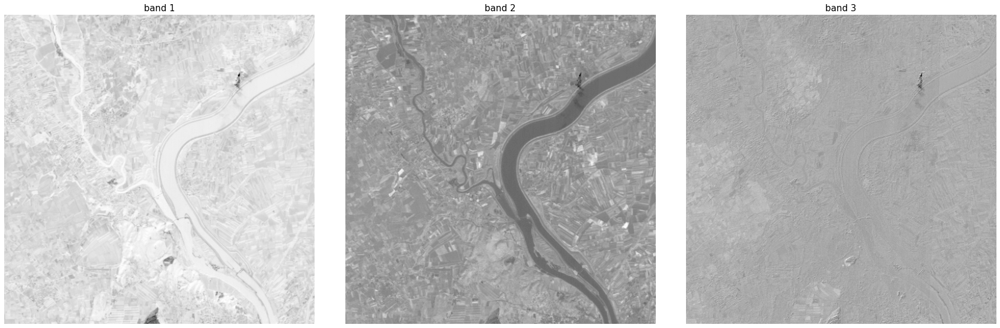

In [245]:
fig,axes = plt.subplots(1,n_bands, figsize=(n_bands*10,12), sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
axes = axes.ravel()
# Visualize them with imshow: 
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    # A compléter
    axes[i].imshow(img_show[:,:,i] / 255, cmap='gray')
    axes[i].set_title('band '+str(i+1),fontsize=15)
    axes[i].axis('off')

La première composante contient quasiment toutes les informations, avec des détails (on voit tous les champs presque individuellement, et on voit les rivières), la seconde reconnaît les étendues d'eau et les grands espaces, la troisième est inutile. 

*Visuellement, on constate que la première composante détecte un certain nombre d'emplacements précis, ainsi que des limites - la seconde semble détecter l'eau et les champs, et la dernière indique des artefacts verticaux sans doute liés aux capteurs*.

In [246]:
# Compute the percentage of inertia of each component:
inertia_mat = [0,0,0]
eig_sum = np.sum(im_eigval)
for i in range(n_bands):
    inertia_mat[i] = im_eigval[i]/eig_sum
print(inertia_mat)

[0.762289522979019, 0.21066954636872934, 0.027040930652251664]


On retrouve donc des nombres qui correspondent exactement à ce que l'on peut voir sur les images que l'on vient d'afficher: la première image contient 76% des informations, la plupart des détails, et on distingue bien l'eau et les lignes de partout.
</br> La deuxième, qui contient notamment les cours d'eau et les petites étendues sombres (d'eau, probablement) représente 21% de l'info et n'est pas complètement à négliger.
</br> La dernière, qui ne contenait rien d'important, représente seulement bien 2.7% des informations (bien que cela représente initialement 33% des données !...)

Il suffit de garder les deux premières bandes pour garder 95% (même 97%) de l'information contenue dans l'image. 

**ACP sur les données LANDSAT sur Tarascon**: Effectuez l’analyse en composantes principales sur les données LANDSAT sur Tarascon. Affichez les images résultats. Calculez le pourcentage d’inertie associé à chaque image et interprétez qualitativement les résultats. Combien d’images faut-il garder pour conserver au moins 95% de l’information ?

In [249]:
path_img = 'Landstat_Tarascon/landsattarasconC'
n_bands = 8

# Second image: Tarascon

img = load_image(path_img +'1')
(imgsh1, imgsh2)=img.shape
print(img.shape)

(512, 512)


In [250]:
img = np.zeros((img.shape[0], img.shape[1], n_bands))
# Stacking up images into the numpy array:
for i in range(n_bands):
    img[:,:,i]=load_image(path_img+str(i+1))

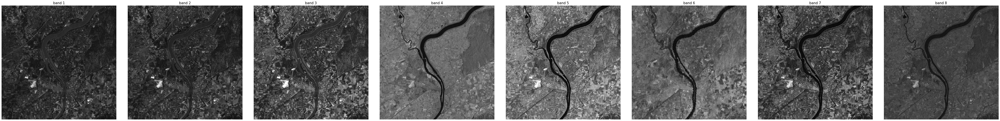

In [251]:
fig,axes = plt.subplots(1,n_bands, figsize=(n_bands*10,12), sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
axes = axes.ravel()

for i in range(n_bands):
    # Use floats instead of 8-bit integers for a clearer view of the image
    axes[i].imshow(img[:,:,i] / 255, cmap='gray')
    axes[i].set_title('band '+str(i+1),fontsize=15)
    axes[i].axis('off')
    

In [252]:
# Reshape the image for practicality: 
imgresh = []
for i in range(n_bands):
    imgresh.append(np.reshape(img[:,:,i], -1).reshape((512*512,1)))

resh_imgs = [[0]*512*512]*n_bands
for i in range(n_bands):
    resh_imgs[i] = imgresh[i]

In [253]:
# Standardization:
means, stands, std_imgs = [],[],[]
for i in range(n_bands):
    means.append(np.mean(resh_imgs[i]))
    stands.append(np.std(resh_imgs[i]))
    std_imgs.append((resh_imgs[i]-means[i])/stands[i])

In [254]:
# Compute the covariance matrix:
img_std=[]
for i in range(n_bands):
    img_std.append(std_imgs[i])
im_mat = np.concatenate(img_std, axis=1)
print(np.shape(im_mat))

im_cov = np.cov(np.transpose(im_mat))
# Compute eigenvalues and vectors with eig:
(im_eigval,img_eigvec) = np.linalg.eig(im_cov)
#print(im_eigval)
#print(img_eigvec)

# Check that that it worked using the formula:
print(im_cov@img_eigvec[0])
print(im_eigval[0]*img_eigvec[0])
print(np.mean(im_cov-img_eigvec*im_eigval*np.transpose(im_eigval)))

(262144, 8)
[ 0.97137552  0.94846444  1.02104904 -0.14906561  0.89956898  0.94549926
  1.02587989  0.38773942]
[ 2.04463652  1.78961244 -1.34055787 -1.99855198  1.25680573  3.23767092
  1.78470886 -1.27871797]
-0.623569089475336


In [255]:
# Lets sort the eigenvalues to be able to choose the components by importance:
#print(im_eigval)
perm = im_eigval.argsort()[::-1]
#print(perm)
im_eigval = im_eigval[perm]
print(im_eigval)
#print(img_eigvec)
img_eigvec = img_eigvec[:,perm]
#print(img_eigvec)

[5.4824206  1.35849262 0.75236145 0.21324232 0.13419912 0.02917675
 0.01993272 0.01020493]


In [256]:
# Lets get the components in separate matrices, so we can display them easily:
img_prod = im_mat@img_eigvec
#print(img_prod)
img_show = np.zeros((img.shape[0], img.shape[1], n_bands))
# Stacking up images into the numpy array:
for i in range(n_bands):
    img_show[:,:,i]=img_prod[:,i].reshape((img.shape[0], img.shape[1]))

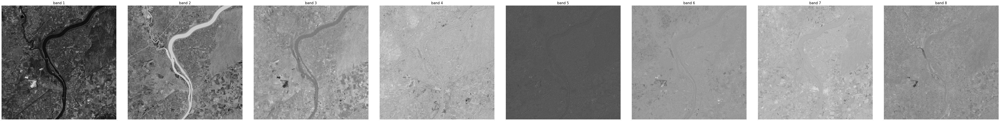

In [257]:
fig,axes = plt.subplots(1,n_bands, figsize=(n_bands*10,12), sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
axes = axes.ravel()
# Visualize them with imshow: 
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    # A compléter
    axes[i].imshow(img_show[:,:,i] / 255, cmap='gray')
    axes[i].set_title('band '+str(i+1),fontsize=15)
    axes[i].axis('off')

In [258]:
# Compute the percentage of inertia of each component:
inertia_mat = [0]*n_bands
eig_sum = np.sum(im_eigval)
for i in range(n_bands):
    inertia_mat[i] = im_eigval[i]/eig_sum
print(inertia_mat)

[0.6852999602748039, 0.16981092985227553, 0.0940448230888719, 0.026655188402293525, 0.016774826455411066, 0.003647079876583042, 0.0024915802799024395, 0.001275611769858594]


In [259]:
iner = 0
i=0
while iner <0.95:
    iner+=inertia_mat[i]
    i+=1
print(iner)
print(i)

0.9758109016182448
4


Il nous faut donc les 4 premières images pour obtenir 97.6% de l'information (en dépassant les 95% entre la 3e et la 4e).

**ACP sur les données LANDSAT sur Kedougou**: Effectuez une ACP sur ce jeu de données. Comparez le résultat avec le dernier capteur défectueux (```CANAL6bruit```) et l'original.

In [260]:
# Capteur normal:
path_img = 'Landstat_Kedougou/landsatKedougouC'
n_bands = 6

# Third image: Kedougou

img = load_image(path_img +'1')
(imgsh1, imgsh2)=img.shape
print(img.shape)

(256, 256)


In [261]:
img = np.zeros((img.shape[0], img.shape[1], n_bands))
# Stacking up images into the numpy array:
for i in range(n_bands):
    img[:,:,i]=load_image(path_img+str(i+1))

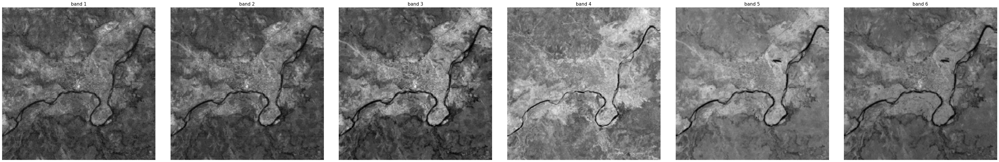

In [262]:
fig,axes = plt.subplots(1,n_bands, figsize=(n_bands*10,12), sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
axes = axes.ravel()

for i in range(n_bands):
    # Use floats instead of 8-bit integers for a clearer view of the image
    axes[i].imshow(img[:,:,i] / 255, cmap='gray')
    axes[i].set_title('band '+str(i+1),fontsize=15)
    axes[i].axis('off')
    

In [264]:
# Reshape the image for practicality: 
imgresh = []
for i in range(n_bands):
    imgresh.append(np.reshape(img[:,:,i], -1).reshape((256*256,1)))

resh_imgs = [[0]*512*512]*n_bands
for i in range(n_bands):
    resh_imgs[i] = imgresh[i]

In [265]:
# Standardization:
means, stands, std_imgs = [],[],[]
for i in range(n_bands):
    means.append(np.mean(resh_imgs[i]))
    stands.append(np.std(resh_imgs[i]))
    std_imgs.append((resh_imgs[i]-means[i])/stands[i])

In [266]:
# Compute the covariance matrix:
img_std=[]
for i in range(n_bands):
    img_std.append(std_imgs[i])
im_mat = np.concatenate(img_std, axis=1)
print(np.shape(im_mat))

im_cov = np.cov(np.transpose(im_mat))
# Compute eigenvalues and vectors with eig:
(im_eigval,img_eigvec) = np.linalg.eig(im_cov)
#print(im_eigval)
#print(img_eigvec)

# Check that that it worked using the formula:
print(im_cov@img_eigvec[0])
print(im_eigval[0]*img_eigvec[0])
print(np.mean(im_cov-img_eigvec*im_eigval*np.transpose(im_eigval)))

(65536, 6)
[-0.19435356 -0.23162132 -0.28898284 -0.15104636 -0.39163905 -0.31363463]
[ 2.06369824  1.11372203 -2.39972127  0.94126168 -3.44441845  0.48564136]
-0.8257821431364758


In [267]:
# Lets sort the eigenvalues to be able to choose the components by importance:
#print(im_eigval)
perm = im_eigval.argsort()[::-1]
#print(perm)
im_eigval = im_eigval[perm]
print(im_eigval)
#print(img_eigvec)
img_eigvec = img_eigvec[:,perm]
#print(img_eigvec)


# Lets get the components in separate matrices, so we can display them easily:
img_prod = im_mat@img_eigvec
#print(img_prod)
img_show = np.zeros((img.shape[0], img.shape[1], n_bands))
# Stacking up images into the numpy array:
for i in range(n_bands):
    img_show[:,:,i]=img_prod[:,i].reshape((img.shape[0], img.shape[1]))

[4.92379213 0.63948139 0.25289858 0.0830269  0.07624918 0.02464338]


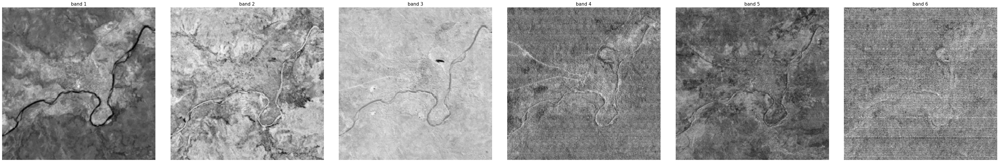

In [268]:
fig,axes = plt.subplots(1,n_bands, figsize=(n_bands*10,12), sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
axes = axes.ravel()
# Visualize them with imshow: 
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    # A compléter
    axes[i].imshow(img_show[:,:,i] / 255, cmap='gray')
    axes[i].set_title('band '+str(i+1),fontsize=15)
    axes[i].axis('off')

In [269]:
#On voit d'ailleurs bien le brouillage progressif des images

# Compute the percentage of inertia of each component:
inertia_mat = [0]*n_bands
eig_sum = np.sum(im_eigval)
for i in range(n_bands):
    inertia_mat[i] = im_eigval[i]/eig_sum
print(inertia_mat)

iner = 0
i=0
while iner <0.95:
    iner+=inertia_mat[i]
    i+=1
print(iner)
print(i)

[0.8206194990614472, 0.10657860465829963, 0.042149120579943786, 0.013837605764684922, 0.01270800227912044, 0.004107167656504151]
0.9693472242996906
3


Cette fois-ci seulement 3 images sont nécessaires pour attendre le threshold de 95% d'informations (0.97)

In [292]:
# Fourth image: Kedougou noisy
# Avec le bruit: 
img_b = load_image('Landstat_Kedougou/landsatKedougouC6bruit')
img[:,:,5]=img_b
print(img[:,:,5].shape)

(256, 256)


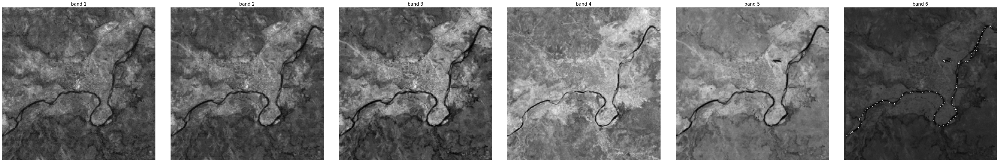

In [293]:
fig,axes = plt.subplots(1,n_bands, figsize=(n_bands*10,12), sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
axes = axes.ravel()

for i in range(n_bands):
    # Use floats instead of 8-bit integers for a clearer view of the image
    axes[i].imshow(img[:,:,i] / 255, cmap='gray')
    axes[i].set_title('band '+str(i+1),fontsize=15)
    axes[i].axis('off')
    

In [294]:
# Reshape the image for practicality: 
imgresh = []
for i in range(n_bands):
    imgresh.append(np.reshape(img[:,:,i], -1).reshape((256*256,1)))

resh_imgs = [[0]*512*512]*n_bands
for i in range(n_bands):
    resh_imgs[i] = imgresh[i]

In [295]:
# Standardization:
means, stands, std_imgs = [],[],[]
for i in range(n_bands):
    means.append(np.mean(resh_imgs[i]))
    stands.append(np.std(resh_imgs[i]))
    std_imgs.append((resh_imgs[i]-means[i])/stands[i])

In [296]:
# Compute the covariance matrix:
img_std=[]
for i in range(n_bands):
    img_std.append(std_imgs[i])
im_mat = np.concatenate(img_std, axis=1)
print(np.shape(im_mat))

im_cov = np.cov(np.transpose(im_mat))
# Compute eigenvalues and vectors with eig:
(im_eigval,img_eigvec) = np.linalg.eig(im_cov)
#print(im_eigval)
#print(img_eigvec)

# Check that that it worked using the formula:
print(im_cov@img_eigvec[0])
print(im_eigval[0]*img_eigvec[0])
print(np.mean(im_cov-img_eigvec*im_eigval*np.transpose(im_eigval)))

(65536, 6)
[-1.54607818 -1.59774193 -1.61143142 -1.18671102 -1.50634239 -1.35759107]
[-1.94843381 -0.23625243 -1.84222624 -1.45529352 -0.89455242 -3.12002019]
2.065363533254695


In [297]:
# Lets sort the eigenvalues to be able to choose the components by importance:
#print(im_eigval)
perm = im_eigval.argsort()[::-1]
#print(perm)
im_eigval = im_eigval[perm]
print(im_eigval)
#print(img_eigvec)
img_eigvec = img_eigvec[:,perm]
#print(img_eigvec)


# Lets get the components in separate matrices, so we can display them easily:
img_prod = im_mat@img_eigvec
#print(img_prod)
img_show = np.zeros((img.shape[0], img.shape[1], n_bands))
# Stacking up images into the numpy array:
for i in range(n_bands):
    img_show[:,:,i]=img_prod[:,i].reshape((img.shape[0], img.shape[1]))

[4.46078876 0.7341834  0.48823245 0.20956893 0.0824201  0.02489792]


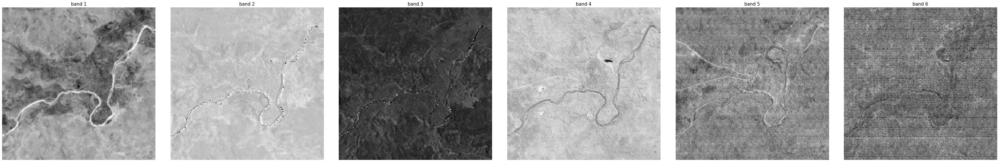

In [298]:
fig,axes = plt.subplots(1,n_bands, figsize=(n_bands*10,12), sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
axes = axes.ravel()
# Visualize them with imshow: 
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    # A compléter
    axes[i].imshow(img_show[:,:,i] / 255, cmap='gray')
    axes[i].set_title('band '+str(i+1),fontsize=15)
    axes[i].axis('off')

In [299]:
#On voit d'ailleurs bien le brouillage progressif des images

# Compute the percentage of inertia of each component:
inertia_mat = [0]*n_bands
eig_sum = np.sum(im_eigval)
for i in range(n_bands):
    inertia_mat[i] = im_eigval[i]/eig_sum
print(inertia_mat)

iner = 0
i=0
while iner <0.95:
    iner+=inertia_mat[i]
    i+=1
print(iner)
print(i)

[0.7434534482488102, 0.12236203301574937, 0.08137083307685972, 0.03492762130919244, 0.01373647437968292, 0.004149589969705313]
0.9821139356506117
4


En brouillant la dernière image, on réduit la qualité de l'information qu'elle contient et il nous faut désormais 4 valeurs propres (4 'images' si l'on reprend ce que j'ai dit plus haut mais ce sont vraiment des directions principales et des valeurs propres) pour avoir une quantité d'information au-delà du threshold 95% (0.98) au lieu des 3. On voit qu'on a besoin d'une valeur propre de plus en brouillant seulement la dernière image. 

*L’effet lié au capteur n’est pas négligeable si on ne regarde que la première image puisqu’il y a 8% de différence entre les deux. Cependant, si on considère plusieurs images, son impact est limité (si on considère 3 images, il n’y a que 2.2% de différence : il faut donc toujours utiliser au moins 3 images pour conserver 90% de l’information).*

### K-means

Dans cette partie, on souhaite réaliser un classificateur automatique pour réaliser une segmentation simple d'images : par exemple, pour séparer terres et rivière.
- Tracer l’histogramme canal par canal est instructif !
- La recherche de prototypes nécessite un peu de patience : il faut rechercher sur l’image les coordonnées de points dont on a pu (ou su) voir l’originalité.

**Classification rivière-terre**: Commencez par tester la procédure sur *SPOT* à l'aide des valeurs exemples pour l’eau et sur la terre. 

In [346]:
def histogramme(image):                                                                                                 #ratioooooooo
    hist = np.zeros(256, dtype=np.float32)
    shap = image.shape
    for j in range(shap[0]):
        for i in range(shap[1]):
            valeur = image[j,i]
            hist[int(valeur)] += 1
    return hist

In [302]:
path_img = 'SPOT/cam' 
n_bands = 3 
size = 512 

img = np.stack(np.array([load_image(path_img+str(i+1)) for i in range(n_bands)]), axis=2)

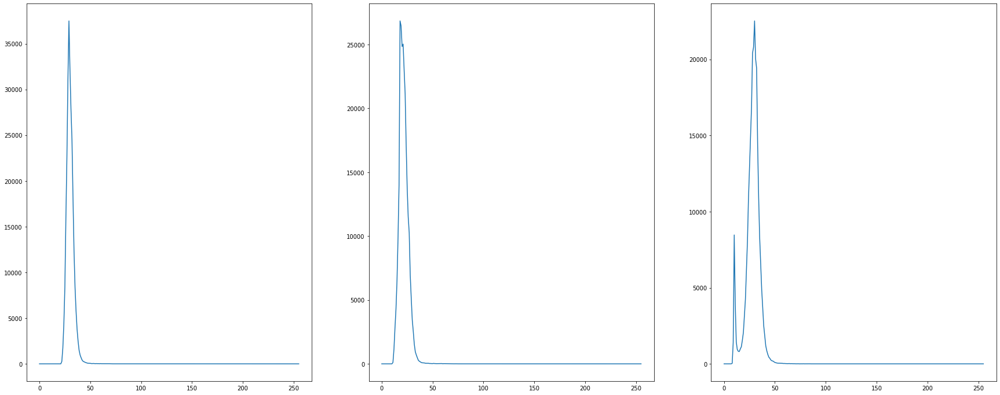

In [303]:
plt.figure(figsize=(n_bands*10, 12))

# Use the "histogramme" function to have an intuition of pixel repartition on each image
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    plt.plot(histogramme(img[:,:,i]))

In [304]:
# Lieu du pixel caracteristique de l'eau
p1=[210, 150]
# Lieu du pixel caracteristique de la terre
p2=[50, 50]

Utilisez la classe ```KMeans``` de ```sklearn```. Choississez le nombre de classes avec ```n_clusters``` et les centres initiaux des classes avec ```init```. Enfin, faites tourner l'algorithme sur l'image choisie avec ```.fit()``` et obtenez les classes de chaque pixel avec ```.predict()```. 
N'oubliez pas d'adapter la structure des données: nous n'avons ici qu'un exemple pour la procédure (un seul canal) avec un grand nombre de caractéristiques à classer (les pixels) - choississez les tailles de vos entrées en conséquence ! 

In [323]:
from sklearn.cluster import KMeans
Keau0 = img[p1[0],p1[1],0]
Kterre0= img[p2[0],p2[1],0]
Keau1 = img[p1[0],p1[1],1]
Kterre1= img[p2[0],p2[1],1]
Keau2 = img[p1[0],p1[1],2]
Kterre2= img[p2[0],p2[1],2]

In [329]:
kmeans = KMeans(n_clusters=2,init=np.array([[Keau0],[Kterre0]])).fit(img[:,:,0].reshape((-1,1)))
print("Water pixel in canal 0 is predicted to be in class " + str(kmeans.predict([[Keau0]])[0])) 
print("Dirt pixel in canal 0 is predicted to be in class " + str(kmeans.predict([[Kterre0]])[0]))

Water pixel in canal 0 is predicted to be in class 1
Dirt pixel in canal 0 is predicted to be in class 1


C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


In [330]:
kmeans = KMeans(n_clusters=2,init=np.array([[Keau1],[Kterre1]])).fit(img[:,:,1].reshape((-1,1)))
print("Water pixel in canal 1 is predicted to be in class " + str(kmeans.predict([[Keau1]])[0])) 
print("Dirt pixel in canal 1 is predicted to be in class " + str(kmeans.predict([[Kterre1]])[0]))

C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


Water pixel in canal 1 is predicted to be in class 1
Dirt pixel in canal 1 is predicted to be in class 1


In [331]:
kmeans = KMeans(n_clusters=2,init=np.array([[Keau2],[Kterre2]])).fit(img[:,:,2].reshape((-1,1)))
print("Water pixel in canal 2 is predicted to be in class " + str(kmeans.predict([[Keau2]])[0])) 
print("Dirt pixel in canal 2 is predicted to be in class " + str(kmeans.predict([[Kterre2]])[0]))

Water pixel in canal 2 is predicted to be in class 0
Dirt pixel in canal 2 is predicted to be in class 1


C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


Faites de même avec les deux autres images. Avec quels canaux pouvez vous obtenir les meilleures segmentation ? Jusqu'à combien de classes ? 

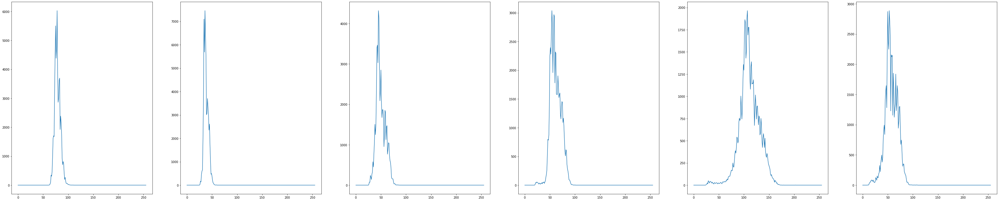

In [335]:
path_img = 'Landstat_Kedougou/landsatkedougouC' 
n_bands = 6 
size = 256

img = np.stack(np.array([load_image(path_img+str(i+1)) for i in range(n_bands)]), axis=2)

Keau0 = img[p1[0],p1[1],0]
Kterre0= img[p2[0],p2[1],0]
Keau1 = img[p1[0],p1[1],1]
Kterre1= img[p2[0],p2[1],1]
Keau2 = img[p1[0],p1[1],2]
Kterre2= img[p2[0],p2[1],2]
Keau3 = img[p1[0],p1[1],3]
Kterre3= img[p2[0],p2[1],3]
Keau4 = img[p1[0],p1[1],4]
Kterre4= img[p2[0],p2[1],4]
Keau5 = img[p1[0],p1[1],5]
Kterre5= img[p2[0],p2[1],5]

Keaut = [Keau0, Keau1, Keau2, Keau3, Keau4, Keau5]
Kterret = [Kterre0,Kterre1,Kterre2,Kterre3,Kterre4,Kterre5]

plt.figure(figsize=(n_bands*10, 12))

# Use the "histogramme" function to have an intuition of pixel repartition on each image
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    plt.plot(histogramme(img[:,:,i]))

In [337]:
for i in range(n_bands):
    kmeans = KMeans(n_clusters=2,init=np.array([[Keaut[i]],[Kterret[i]]])).fit(img[:,:,i].reshape((-1,1)))
    print("Water pixel in canal "+str(i)+" is predicted to be in class " + str(kmeans.predict([[Keaut[i]]])[0])) 
    print("Dirt pixel in canal "+str(i)+" is predicted to be in class " + str(kmeans.predict([[Kterret[i]]])[0]))

C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


Water pixel in canal 0 is predicted to be in class 0
Dirt pixel in canal 0 is predicted to be in class 1
Water pixel in canal 1 is predicted to be in class 0
Dirt pixel in canal 1 is predicted to be in class 0
Water pixel in canal 2 is predicted to be in class 0
Dirt pixel in canal 2 is predicted to be in class 0
Water pixel in canal 3 is predicted to be in class 0
Dirt pixel in canal 3 is predicted to be in class 1
Water pixel in canal 4 is predicted to be in class 0
Dirt pixel in canal 4 is predicted to be in class 1
Water pixel in canal 5 is predicted to be in class 0
Dirt pixel in canal 5 is predicted to be in class 0


C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


In [338]:
#Les canaux 0 et 3 et 4. 

In [345]:
#Le 4 est aussi celui qui a marché en bas...

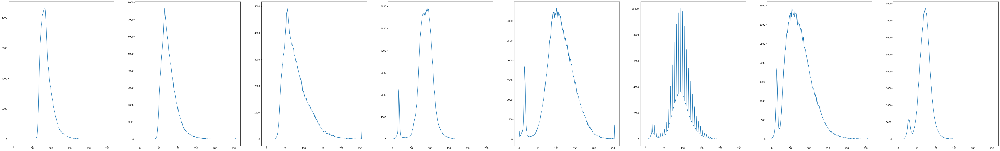

In [342]:
path_img = 'Landstat_Tarascon/landsattarasconC' 
n_bands = 8 
size = 512

img = np.stack(np.array([load_image(path_img+str(i+1)) for i in range(n_bands)]), axis=2)

Keau0 = img[p1[0],p1[1],0]
Kterre0= img[p2[0],p2[1],0]
Keau1 = img[p1[0],p1[1],1]
Kterre1= img[p2[0],p2[1],1]
Keau2 = img[p1[0],p1[1],2]
Kterre2= img[p2[0],p2[1],2]
Keau3 = img[p1[0],p1[1],3]
Kterre3= img[p2[0],p2[1],3]
Keau4 = img[p1[0],p1[1],4]
Kterre4= img[p2[0],p2[1],4]
Keau5 = img[p1[0],p1[1],5]
Kterre5= img[p2[0],p2[1],5]
Keau6 = img[p1[0],p1[1],4]
Kterre6= img[p2[0],p2[1],4]
Keau7 = img[p1[0],p1[1],5]
Kterre7= img[p2[0],p2[1],5]

Keaut = [Keau0, Keau1, Keau2, Keau3, Keau4, Keau5, Keau6, Keau7]
Kterret = [Kterre0,Kterre1,Kterre2,Kterre3,Kterre4,Kterre5, Kterre6,Kterre7]

plt.figure(figsize=(n_bands*10, 12))

# Use the "histogramme" function to have an intuition of pixel repartition on each image
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    plt.plot(histogramme(img[:,:,i]))

In [343]:
for i in range(n_bands):
    kmeans = KMeans(n_clusters=2,init=np.array([[Keaut[i]],[Kterret[i]]])).fit(img[:,:,i].reshape((-1,1)))
    print("Water pixel in canal "+str(i)+" is predicted to be in class " + str(kmeans.predict([[Keaut[i]]])[0])) 
    print("Dirt pixel in canal "+str(i)+" is predicted to be in class " + str(kmeans.predict([[Kterret[i]]])[0]))

C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


Water pixel in canal 0 is predicted to be in class 0
Dirt pixel in canal 0 is predicted to be in class 0
Water pixel in canal 1 is predicted to be in class 0
Dirt pixel in canal 1 is predicted to be in class 1


C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


Water pixel in canal 2 is predicted to be in class 0
Dirt pixel in canal 2 is predicted to be in class 0
Water pixel in canal 3 is predicted to be in class 1
Dirt pixel in canal 3 is predicted to be in class 1
Water pixel in canal 4 is predicted to be in class 0
Dirt pixel in canal 4 is predicted to be in class 1


C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


Water pixel in canal 5 is predicted to be in class 1
Dirt pixel in canal 5 is predicted to be in class 1
Water pixel in canal 6 is predicted to be in class 1


C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


Dirt pixel in canal 6 is predicted to be in class 1
Water pixel in canal 7 is predicted to be in class 0
Dirt pixel in canal 7 is predicted to be in class 0


C:\Users\Guillaume\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


In [344]:
#Canal 4 (infrared) is the best !

Nous garderons le canal 4 (et par manque de temps (retard) je n'ai pas pu tester l'augmentation du nombre de clusters / classes)